# Computer Vision color spaces

### Import statements

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

### To edit an image making a copy of it is always a good idea!

<function matplotlib.pyplot.show(close=None, block=None)>

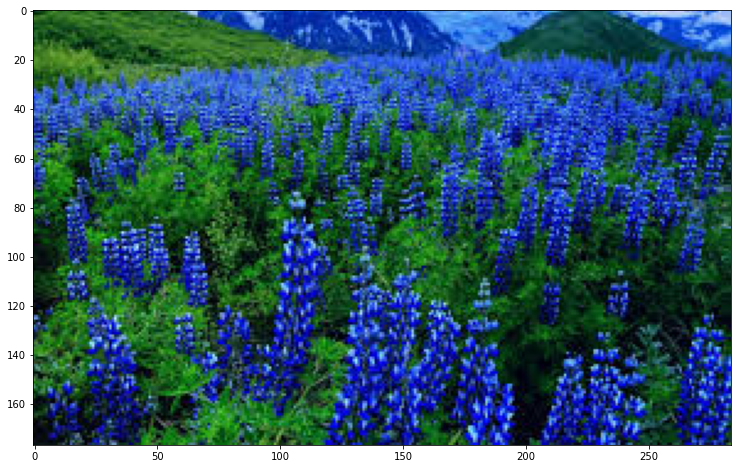

In [15]:
# Load an image
img = cv2.imread('./img/blue-flowers.jpg')
# And make a copy of the original image to avoid manipulating the original image
blueflowers = img.copy()
blueflowers_rgb = cv2.cvtColor(blueflowers, cv2.COLOR_BGR2RGB)
plt.figure(figsize = (16, 8))
blue_fig = plt.imshow(blueflowers_rgb)
plt.show

[Hint](# "Numpy .copy function") 

## Color Spaces

### BGR Spliting the color channels

In [16]:
# Load a color image and split in is different B, G and R channels
B, G, R  = cv2.split(blueflowers_rgb)

[Hint](# "cv2.split") 

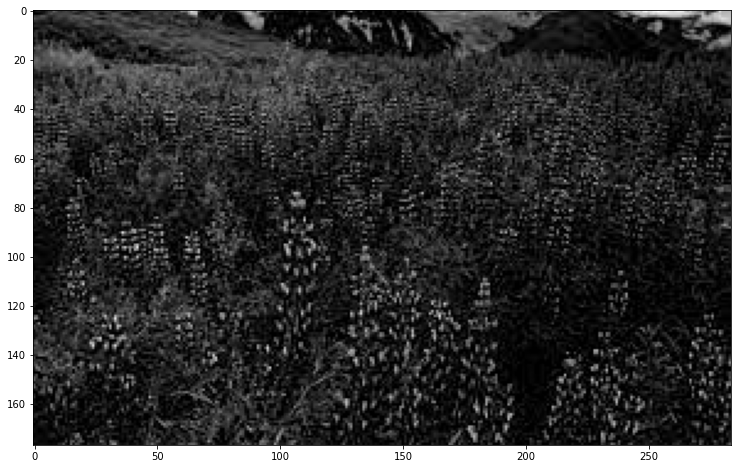

In [17]:
# Show each channel channel on screen
plt.figure(figsize = (16, 8))
plt.imshow(B, cmap= 'gray')

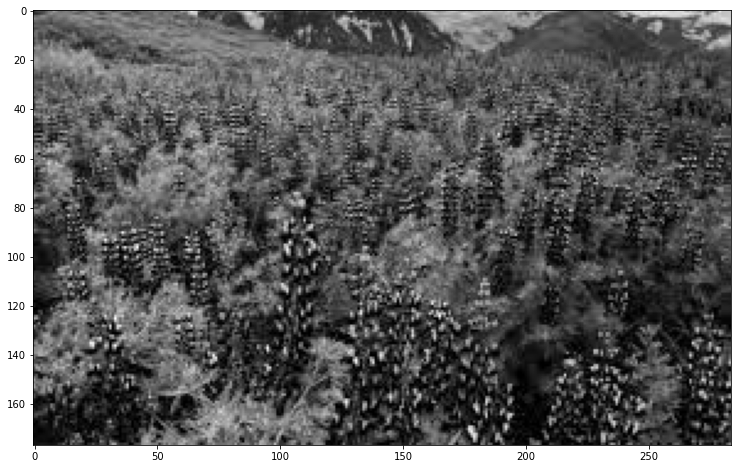

In [18]:
plt.figure(figsize = (16, 8))
plt.imshow(G, cmap= 'gray')

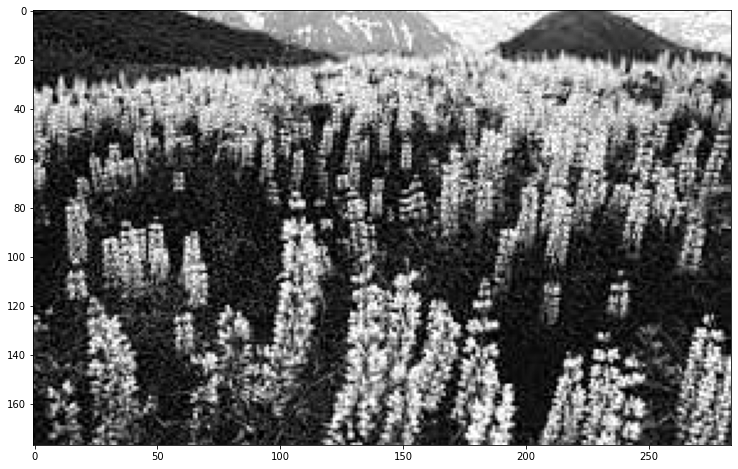

In [19]:
plt.figure(figsize = (16, 8))
plt.imshow(R, cmap= 'gray')

#### Merging the color channels

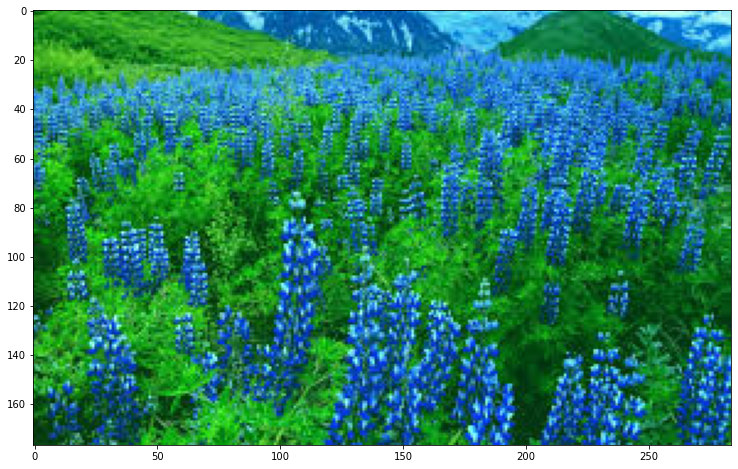

In [23]:
# Modify a channel and then merge them all again
G = cv2.add(G, 50) # modifying the G channel
merged = cv2.merge([B,G,R])
plt.figure(figsize = (16, 8))
plt.imshow(merged)

[Hint](# "cv2.merge") 

In [28]:
# Create a black canvas with the same size as the image you loaded
black = np.zeros(B.shape).astype('uint8')

[Hint](# "use numpy np.zeros function with the img.shape[:2]") 

<function matplotlib.pyplot.show(close=None, block=None)>

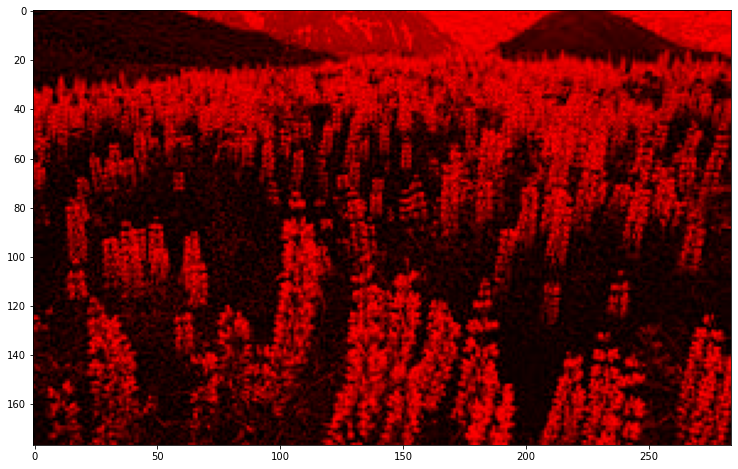

In [36]:
# Merge each channel with the black canvas 
# So you will end up with 3 images: (Red,Black,Black), (Black,Green,Black) and (Black,Black,Blue) 
# Assuming you are working with RGB, but BGR is also fine
rblack = cv2.merge([R, black, black])
gblack = cv2.merge([black, G, black])
bblack = cv2.merge([black, black, B])

#display red
plt.figure(figsize = (16, 8))
plt.imshow(rblack)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

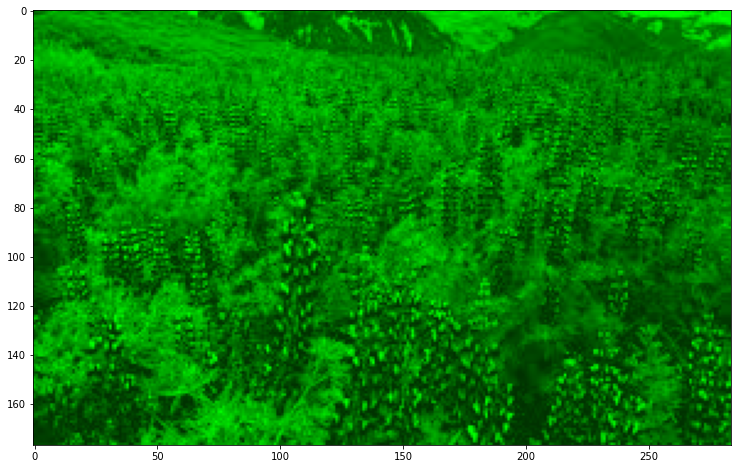

In [37]:
#display green
plt.figure(figsize = (16, 8))
plt.imshow(gblack)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

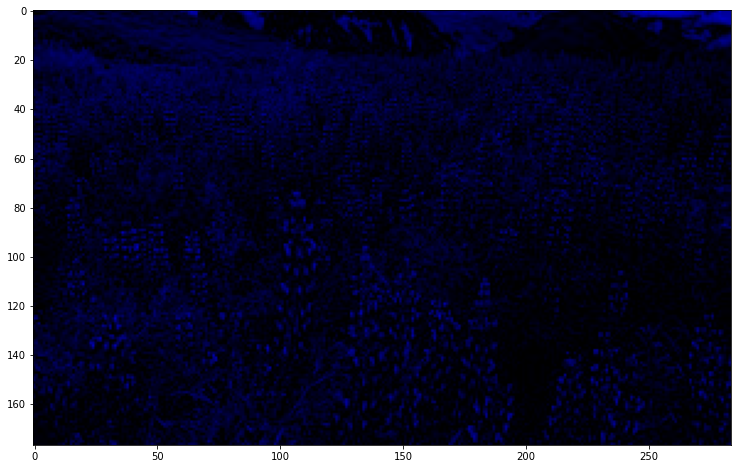

In [38]:
#display blue
plt.figure(figsize = (16, 8))
plt.imshow(bblack)
plt.show

[Hint](# "cv2.merge") 

### HSV: Hue Saturation Value

#### M&Ms challenge!

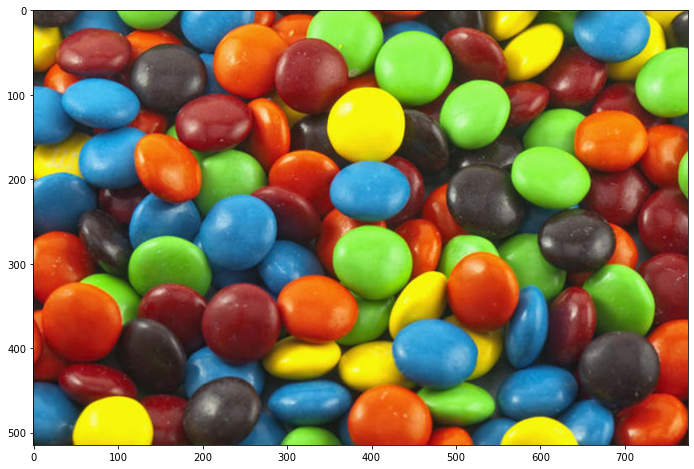

In [42]:
# Use the image below and convert it from BGR to HSV
img = cv2.imread('img/m.jpg')
plt.figure(figsize = (16,8));
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB));

In [44]:
# Split the H,S and V channels 
channelhsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
H, S, V = cv2.split(channelhsv)

[Hint](# "cv2.cvtColor") 

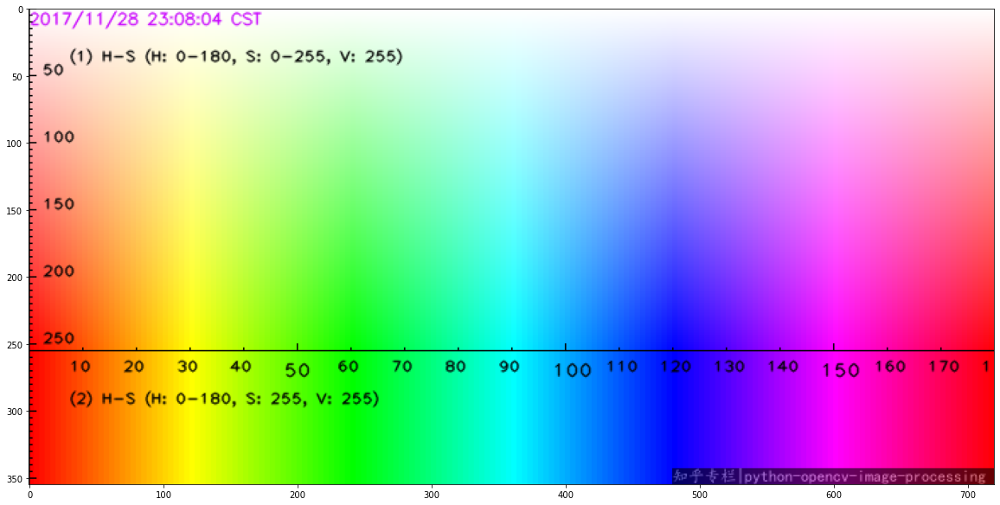

In [47]:
rangehsv = cv2.imread('img/hsv.png')
#cv2.imshow('rangehsv', rangehsv)
#cv2.waitKey(0)
#cv2.destroyAllWindows()
#cv2.waitKey(1)
channelhsv
plt.figure(figsize = (20,15));
plt.imshow(cv2.cvtColor(rangehsv,cv2.COLOR_BGR2RGB));

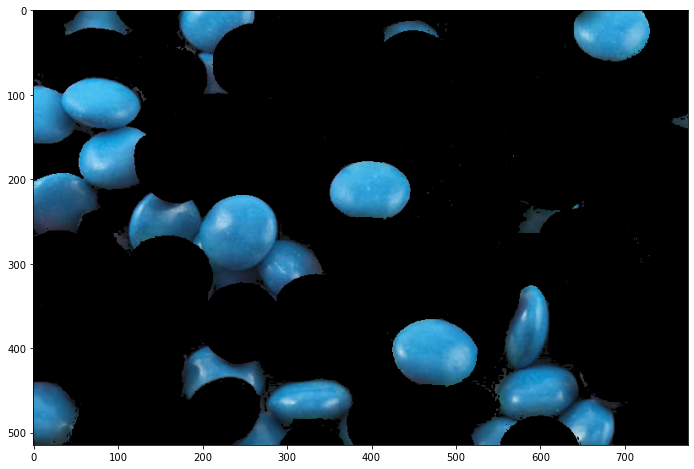

In [52]:
# Create a mask to filter out the Blue M&Ms (remember you need a lower and upper range)
# Make a copy of the hsv image and apply the mask to it, then display the image
blue_lower_range = (90, 20, 0)
blue_upper_range = (140, 255, 255)

blue_filter = cv2.inRange(channelhsv, blue_lower_range, blue_upper_range)

# Make a copy of the hsv image
masked_mm = img.copy()
#apply the mask to it
masked_mm[blue_filter == 0] = [0, 0, 0]

#then display the image
plt.figure(figsize = (16,8));
plt.imshow(cv2.cvtColor(masked_mm,cv2.COLOR_BGR2RGB));


[Hint](# "cv2.inRange") 

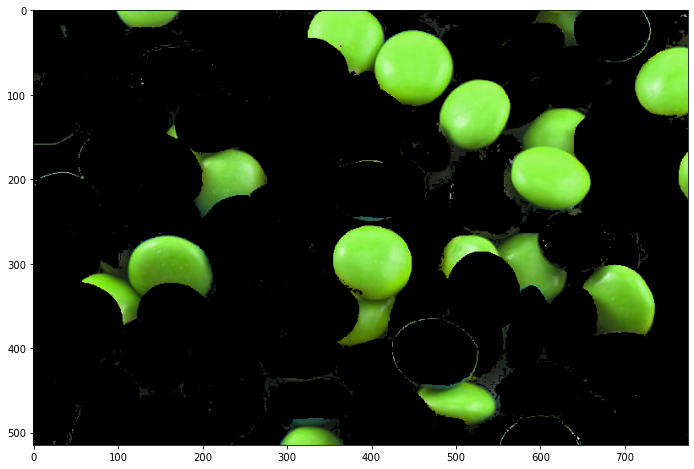

In [55]:
# Repeat the same but now with the greens

# Create a mask to filter out the green M&Ms (remember you need a lower and upper range)
# Make a copy of the hsv image and apply the mask to it, then display the image
green_lower_range = (35, 20, 0)
green_upper_range = (90, 255 , 255)

green_filter = cv2.inRange(channelhsv, green_lower_range, green_upper_range)

# Make a copy of the hsv image
masked_mm = img.copy()
#apply the mask to it
masked_mm[green_filter == 0] = [0, 0, 0]

#then display the image
plt.figure(figsize = (16,8));
plt.imshow(cv2.cvtColor(masked_mm,cv2.COLOR_BGR2RGB));

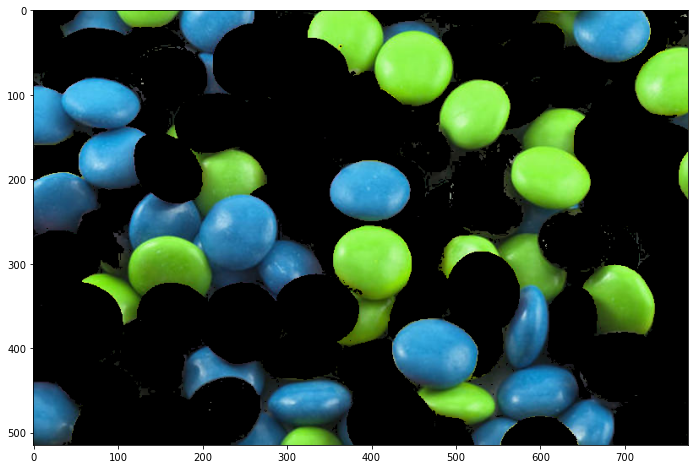

In [57]:
# Now combine both masks togheter so we can see all greens and blues in the same image!
combined_filter = cv2.add(blue_filter, green_filter)

# Make a copy of the hsv image
masked_mm = img.copy()
#apply the mask to it
masked_mm[combined_filter == 0] = [0, 0, 0]

plt.figure(figsize = (16,8));
plt.imshow(cv2.cvtColor(masked_mm,cv2.COLOR_BGR2RGB));

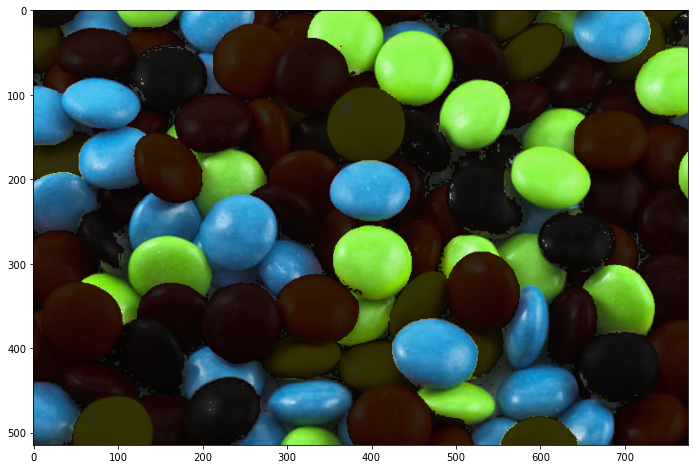

In [63]:
# Now lets combine both masks but also some opacity, we want to be able to see all M&Ms but
# Blues and greens will show as int he image above while the other colors will be faded out with some opacity
# You just need to add alpha to apply opacity to the dark parts of the mask, then display the image

#first create a copy of the original image
masked_mm_2 = img.copy()

#set opacity (alpha and beta)
opacity = 0.2

#apply the addweighted function to add alpha to the dark side of the mask.
overlayed = cv2.addWeighted(masked_mm_2, opacity, masked_mm, 1- opacity, 0)

#display
plt.figure(figsize = (16,8));
plt.imshow(cv2.cvtColor(overlayed,cv2.COLOR_BGR2RGB));

[Hint](# "cv2.addWeighted") 

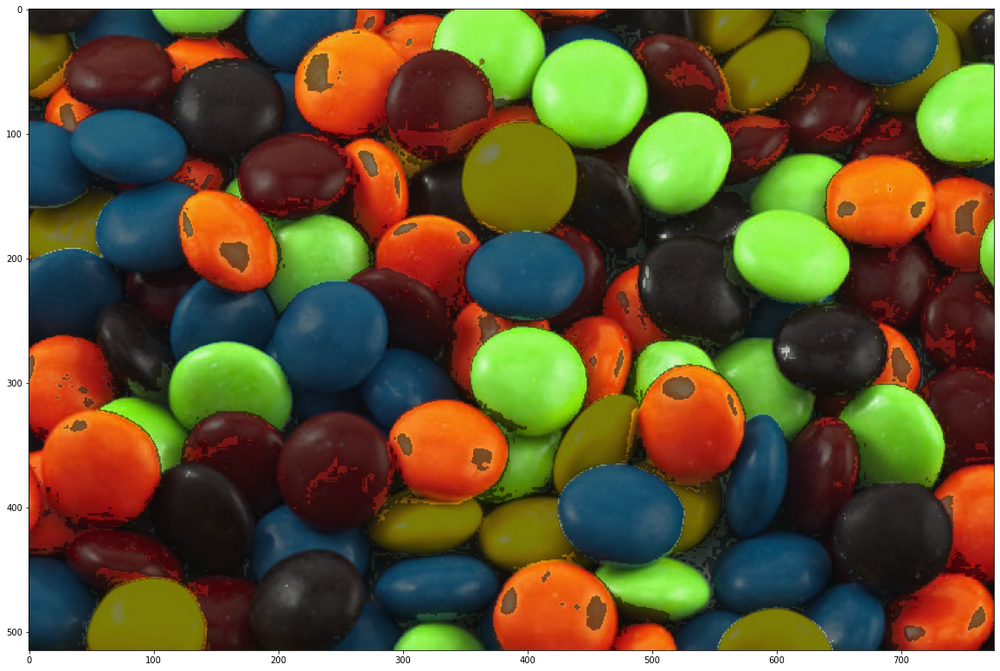

In [9]:
# Below you will find an example with oranges and greens just for reference so you can see what we want to accomplish
# In this example the oranges are not perfect, and it can be improved a lot easily.

## Mini project

### Level 1

#### Ball tracker

1. Given an image with a ball on it isolate the ball

### Level 2

#### Ball tracker

1. Make it track a ball in real time (either with a video or a webcam)

### Level 3

#### Ball Tracker

1. Can you make it track two or more different color balls at the same time?